In [1]:
import numpy as np
import pandas as pd
import math
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df = pd.read_csv('../data_prep/hot_plus_random.csv')

In [3]:
df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature,success
0,0.565,0.547,0.0,-7.722,1.0,0.0347,0.5790,0.000000,0.194,0.252,75.018,audio_features,1MOqMyQ7CULmWWjovkFY5B,spotify:track:1MOqMyQ7CULmWWjovkFY5B,https://api.spotify.com/v1/tracks/1MOqMyQ7CULm...,https://api.spotify.com/v1/audio-analysis/1MOq...,209320.0,4.0,1.0
1,0.578,0.894,10.0,-5.420,1.0,0.0296,0.0103,0.000003,0.216,0.741,165.980,audio_features,2dwhMQsFeHr2S787WxqAqW,spotify:track:2dwhMQsFeHr2S787WxqAqW,https://api.spotify.com/v1/tracks/2dwhMQsFeHr2...,https://api.spotify.com/v1/audio-analysis/2dwh...,347107.0,4.0,1.0
2,0.529,0.496,7.0,-9.007,1.0,0.0290,0.1730,0.000000,0.251,0.278,136.859,audio_features,3y4LxiYMgDl4RethdzpmNe,spotify:track:3y4LxiYMgDl4RethdzpmNe,https://api.spotify.com/v1/tracks/3y4LxiYMgDl4...,https://api.spotify.com/v1/audio-analysis/3y4L...,250547.0,4.0,1.0
3,0.488,0.923,2.0,-3.697,1.0,0.1030,0.1290,0.000000,0.158,0.818,183.891,audio_features,296XGtH5MeGisqD3uAz6Q6,spotify:track:296XGtH5MeGisqD3uAz6Q6,https://api.spotify.com/v1/tracks/296XGtH5MeGi...,https://api.spotify.com/v1/audio-analysis/296X...,202253.0,4.0,1.0
4,0.753,0.450,9.0,-6.909,1.0,0.0924,0.2740,0.000002,0.321,0.560,109.405,audio_features,6kD36kVRn5leDDbjXpHQY0,spotify:track:6kD36kVRn5leDDbjXpHQY0,https://api.spotify.com/v1/tracks/6kD36kVRn5le...,https://api.spotify.com/v1/audio-analysis/6kD3...,288933.0,4.0,1.0


In [4]:
df.shape

(15714, 19)

# Univariate Analysis: Numerical Variable

I see there are 13 audio features I'm interested in: danceability energy key loudness mode speechiness acousticness instrumentalness liveness valence tempo duration_ms time_signature. The 'success' column is the target

In [5]:
df_numeric = df[['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness',
                'liveness', 'valence', 'tempo', 'duration_ms']]

In [6]:
df_numeric.describe()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,15714.000000,15714.000000,15714.000000,15714.000000,15714.000000,15714.000000,15714.000000,15714.000000,15714.000000,1.571400e+04
mean,0.599414,0.552151,-10.371038,0.261971,0.344270,0.112481,0.225027,0.483976,117.232379,2.176059e+05
std,0.175795,0.261042,6.866812,0.341849,0.331036,0.281398,0.190886,0.242454,31.655250,1.332975e+05
min,0.000000,0.000000,-47.395000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.253000e+03
25%,0.501000,0.329000,-14.563500,0.039000,0.040200,0.000000,0.103000,0.299000,93.536250,1.625560e+05
50%,0.632000,0.590000,-7.626000,0.068600,0.231000,0.000000,0.147000,0.484000,116.465000,2.110000e+05
75%,0.717000,0.772000,-5.294000,0.317000,0.615000,0.000381,0.293000,0.669000,137.138250,2.497578e+05
max,0.986000,1.000000,0.175000,0.971000,0.996000,1.000000,1.000000,1.000000,247.994000,4.354000e+06


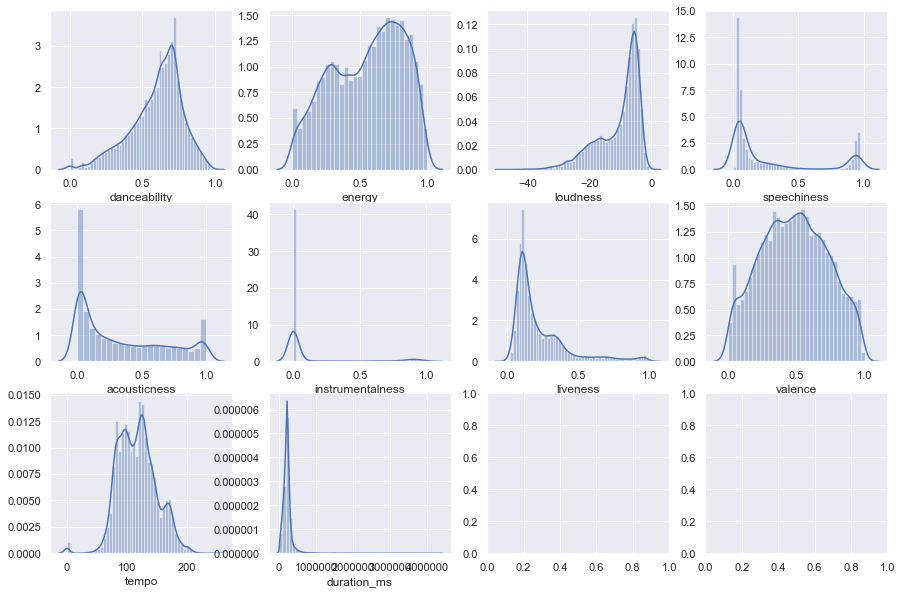

In [7]:
# this plots multiple seaborn histograms on different subplots.
# 
def plot_multiple_histograms(df, cols):
    num_plots = len(cols)
    num_cols = math.ceil(np.sqrt(num_plots))
    num_rows = math.ceil(num_plots/num_cols)
        
    fig, axs = plt.subplots(num_rows, num_cols)
    
    for ind, col in enumerate(cols):
        i = math.floor(ind/num_cols)
        j = ind - i*num_cols
            
        if num_rows == 1:
            if num_cols == 1:
                sns.distplot(df[col], kde=True, ax=axs)
            else:
                sns.distplot(df[col], kde=True, ax=axs[j])
        else:
            sns.distplot(df[col], kde=True, ax=axs[i, j])

sns.set(rc={'figure.figsize':(15,10)})            
plot_multiple_histograms(df_numeric, ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 
                                      'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms'])

# Univariate Analysis: Categorical Variables

In [8]:
# Create an array with the colors you want to use
colors = ['tab:blue', 'tab:red' ]

# Set your custom color palette
customPalette = sns.set_palette(sns.color_palette(colors))

In [9]:
#select non-numeric variables
df_non_numeric = df[['key', 'mode', 'time_signature', 'success']]

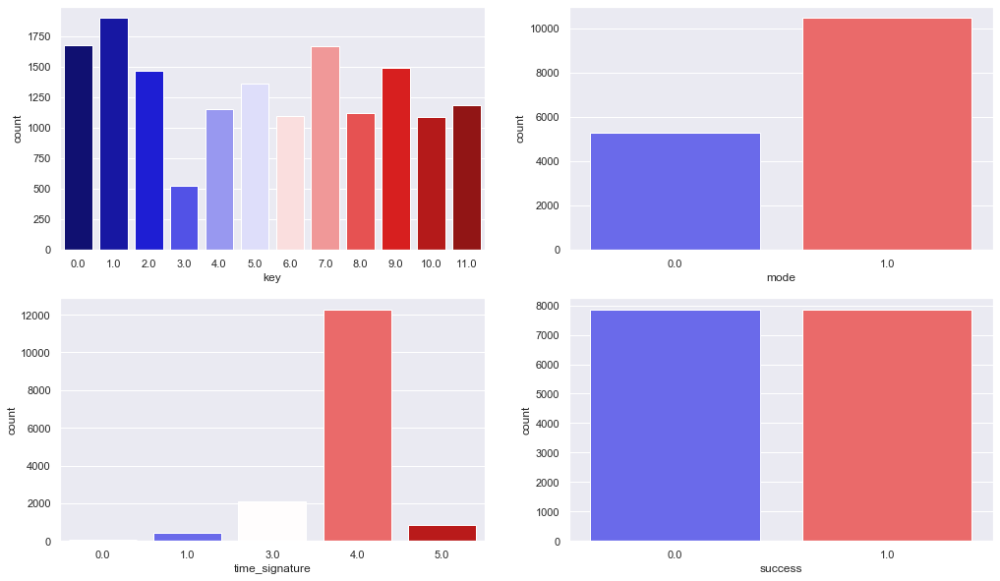

In [10]:
# this plots multiple seaborn count plots on different subplots.
# 
def plot_multiple_histograms(df, cols):
    num_plots = len(cols)
    num_cols = math.ceil(np.sqrt(num_plots))
    num_rows = math.ceil(num_plots/num_cols)
        
    fig, axs = plt.subplots(num_rows, num_cols)
    
    for ind, col in enumerate(cols):
        i = math.floor(ind/num_cols)
        j = ind - i*num_cols
            
        if num_rows == 1:
            if num_cols == 1:
                sns.countplot(df[col], ax=axs)
            else:
                sns.countplot(df[col], ax=axs[j])
        else:
            sns.countplot(df[col], ax=axs[i, j], palette='seismic')

sns.set(rc={'figure.figsize':(17,10)})            
plot_multiple_histograms(df_non_numeric, ['key', 'mode', 'time_signature', 'success'])

# Multivariate Analysis

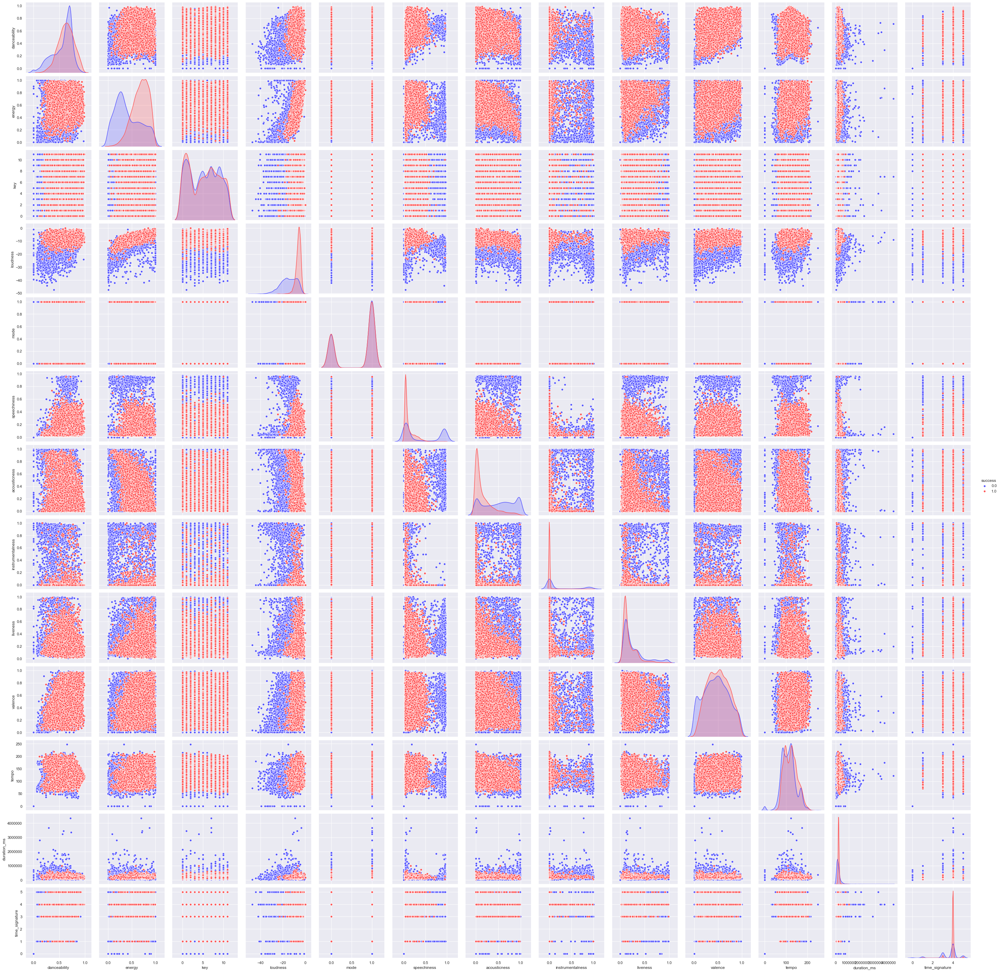

In [11]:
sns.pairplot(df, hue='success', height=3, palette='seismic');

## Scatter Plot: Two Numerical Variables

In [12]:
df_numeric_2 = df[['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness',
                'liveness', 'valence', 'tempo', 'duration_ms', 'success']]

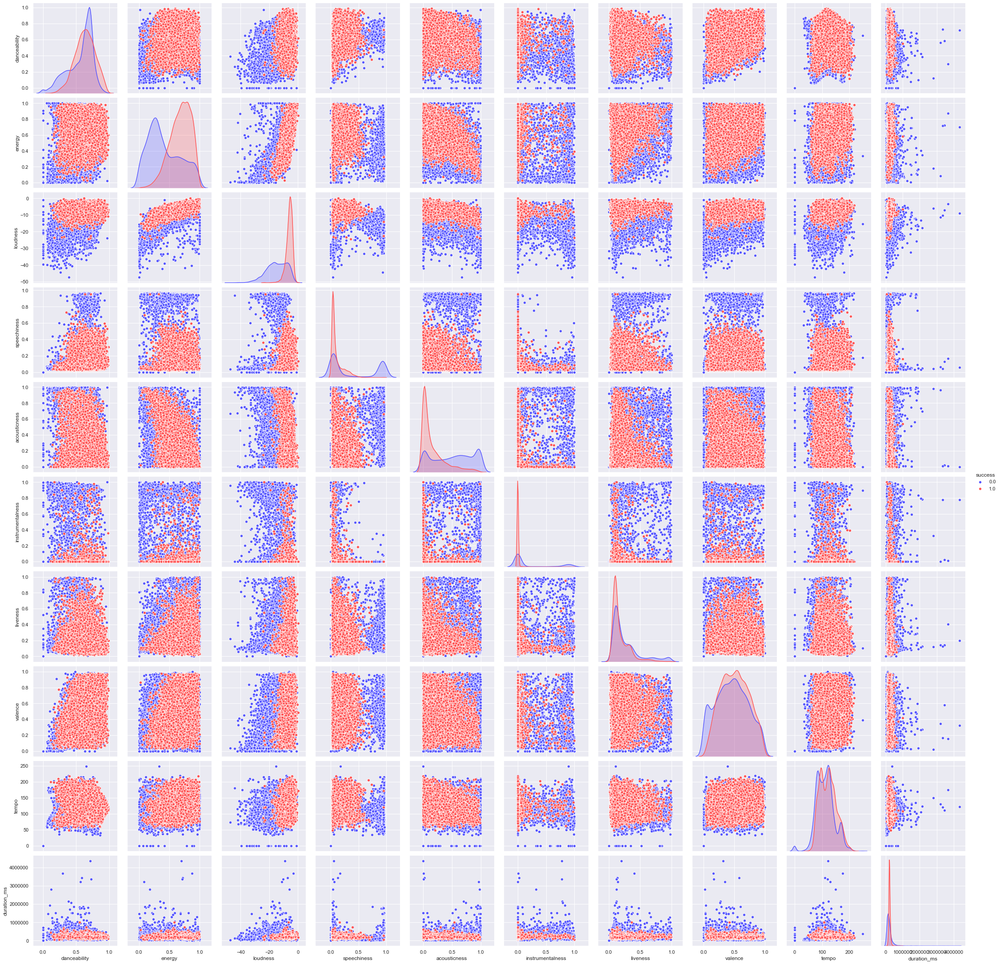

In [13]:
sns.pairplot(df_numeric_2, height=3, hue='success', palette='seismic');

## Scatter Plot: Two Categorical Variables

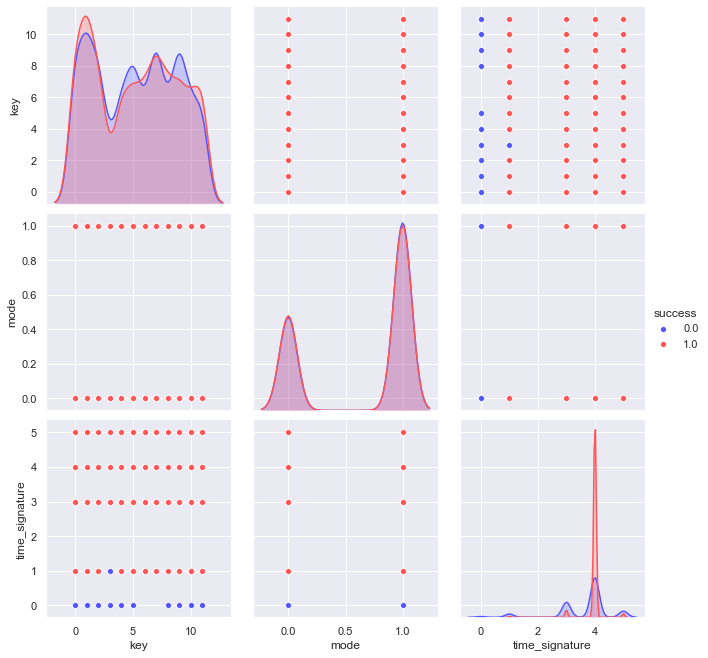

In [14]:
sns.pairplot(df_non_numeric, height=3, hue='success', palette='seismic');

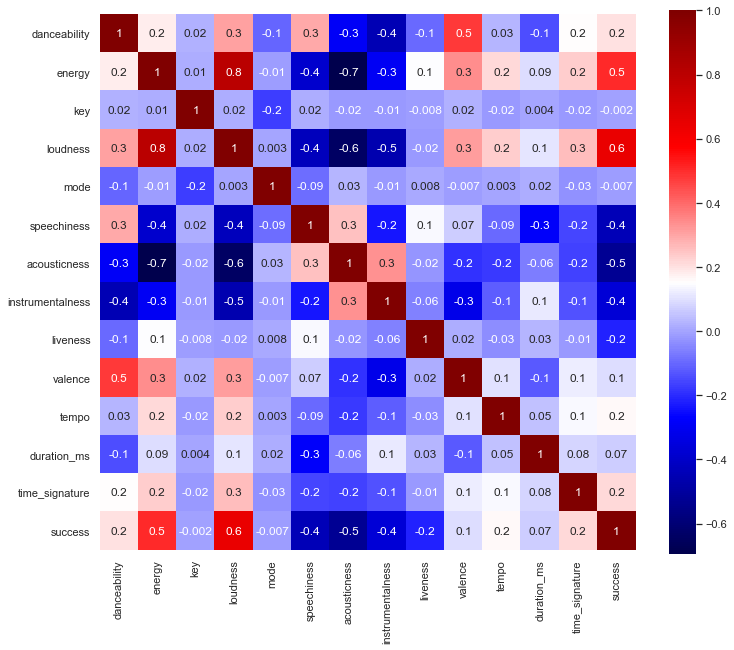

In [17]:
sns.set(rc={'figure.figsize':(12,10)})
sns.heatmap(df.corr(), annot = True, fmt='.1g', square=True, cmap='seismic');

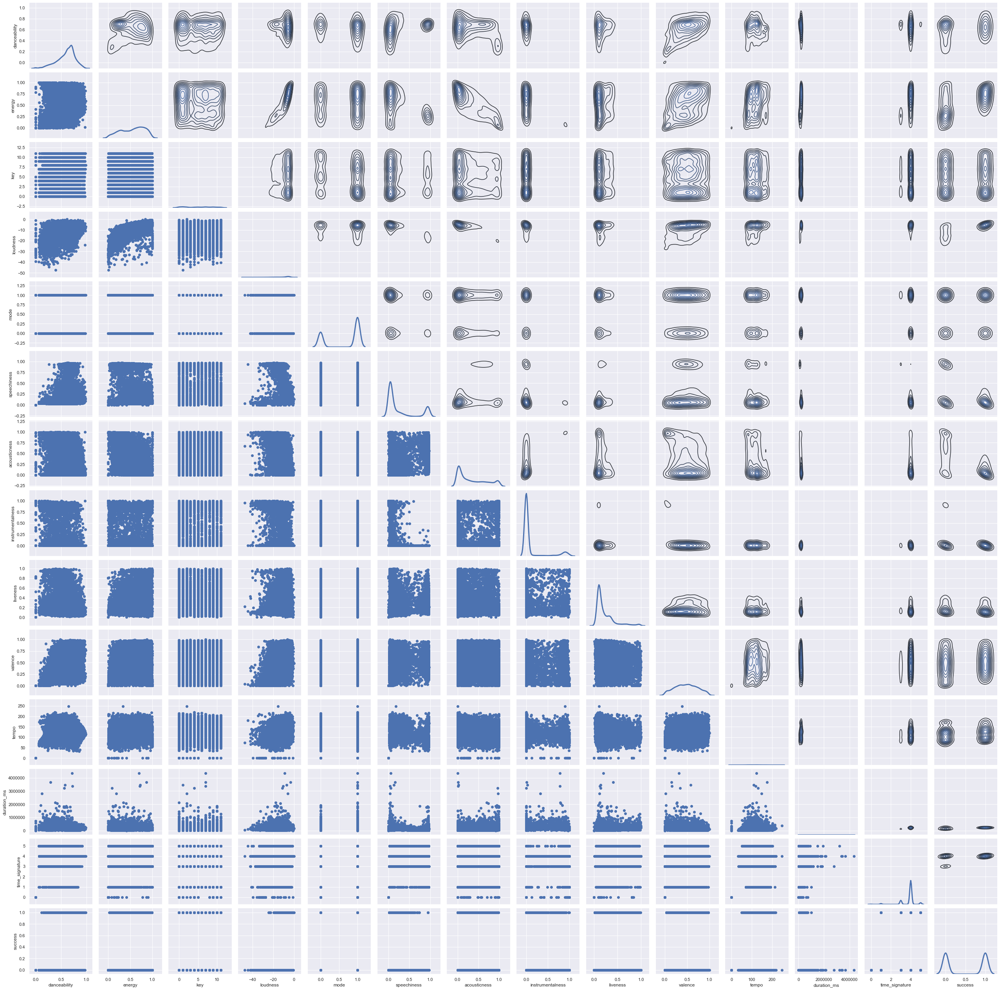

In [16]:
grids = sns.PairGrid(df)
grids.map_diag(sns.kdeplot, lw=3, legend=False)
grids.map_upper(sns.kdeplot)
grids.map_lower(plt.scatter);